In [1]:
import sys
sys.path.append('C:\\projects\\UTNCE\\src\\utnce202402')

In [2]:
from simplify import *
from prepare import *
from routing import *
from percolation_plot import *
from generate import *
from transfer import *
from copy import deepcopy
from shapely.geometry import Point
from pyproj import Proj, Transformer

In [3]:
osm_path = "C:\\projects\\UTNCE\\data\\Amsterdam.large.pbf"

# Tram-Amsterdam

## Generate tram networks

In [4]:
city_tram_stations, edges, nodes, city_tram_routes = prepare_tram(osm_path)

topology: 100%|██████████████████████████████████████████████████████████████████| 2204/2204 [00:00<00:00, 8486.07it/s]


Calculate_degree possibly unhappy


In [5]:
edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to
0,7045610,"LINESTRING (4.9324018 52.3610615, 4.932387 52....",tram,None,0,0,1,28.561299,0.002040,28,"(0, 1)","(1, 0)"
1,7045616,"LINESTRING (4.934085 52.3609657, 4.9340765 52....",tram,None,1,2,3,146.082551,0.010434,146,"(2, 3)","(3, 2)"
2,7045675,"LINESTRING (4.9337809 52.3611734, 4.9339017 52...",tram,None,2,4,5,390.987463,0.027928,390,"(4, 5)","(5, 4)"
3,7045689,"LINESTRING (4.9394 52.361617, 4.9385742 52.361...",tram,None,3,6,7,345.247175,0.024661,345,"(6, 7)","(7, 6)"
4,7045994,"LINESTRING (4.9157261 52.365067, 4.9157046 52....",tram,None,4,8,1730,35.152166,0.002511,35,"(8, 1730)","(1730, 8)"
...,...,...,...,...,...,...,...,...,...,...,...,...
2199,1185084715,"LINESTRING (4.8520736 52.3479443, 4.8521852 52...",tram,None,2199,1496,594,11.280287,0.000806,11,"(1496, 594)","(594, 1496)"
2200,1185084716,"LINESTRING (4.852325 52.3480075, 4.852489 52.3...",tram,None,2200,562,1072,12.010525,0.000858,12,"(562, 1072)","(1072, 562)"
2201,1185084717,"LINESTRING (4.8516012 52.3470208, 4.8519064 52...",tram,None,2201,1497,561,81.765515,0.005840,81,"(1497, 561)","(561, 1497)"
2202,1185084718,"LINESTRING (4.8522982 52.348033, 4.8524709 52....",tram,None,2202,566,1079,12.587379,0.000899,12,"(566, 1079)","(1079, 566)"


In [6]:
nodes

,geometry,degree,id
0,POINT (4.9324018 52.3610615),3,0
1,POINT (4.9321097 52.361227),3,1
2,POINT (4.934085 52.3609657),3,2
3,POINT (4.933017 52.3603624),3,3
4,POINT (4.9337809 52.3611734),3,4
...,...,...,...
1915,POINT (4.9009826 52.3777045),0,1915
1916,POINT (4.890644 52.3719008),2,1916
1917,POINT (4.9899502 52.3580579),2,1917
1918,POINT (4.9272548 52.357015),0,1918


In [7]:
city_tram_routes

,osm_id,route,to,name,ref,network,service,geometry
17,31398,tram,"Amsterdam, De Boelelaan/VU",Tram 24: Amsterdam Centraal Station => Amsterd...,24,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.89406 52.37387, 4.89361 52..."
18,31530,tram,"Amsterdam, Oudenaardeplantsoen",Tram 2: Amsterdam Centraal Station => Amsterda...,2,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.81102 52.34641, 4.81118 52..."
19,31794,tram,"Amsterdam, Drentepark",Tram 4: Amsterdam Centraal Station => Amsterda...,4,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.89406 52.37387, 4.89361 52..."
22,32579,tram,"Amsterdam, Osdorp Dijkgraafsplein",Tram 17: Amsterdam Centraal Station => Amsterd...,17,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.89915 52.37828, 4.89919 52..."
23,32615,tram,"Amsterdam, IJburg",Tram 26: Amsterdam Centraal Station => Amsterd...,26,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.90035 52.37793, 4.90035 52..."
24,32867,tram,"Amsterdam, Lambertus Zijlplein",Tram 13: Amsterdam Centraal Station => Amsterd...,13,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.89922 52.37830, 4.89926 52..."
390,4494870,tram,"Amsterdam, Centraal Station",Tram 4: Amsterdam Station RAI => Amsterdam Cen...,4,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.88956 52.33608, 4.88962 52..."
391,4497721,tram,"Amsterdam, Centraal Station",Tram 2: Amsterdam Nieuw Sloten => Amsterdam Ce...,2,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.80985 52.34614, 4.81032 52..."
392,4512710,tram,Amsterdam Centraal Station,Tram 13: Amsterdam Geuzenveld => Amsterdam Cen...,13,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.80291 52.37726, 4.80320 52..."
393,4513899,tram,"Amsterdam, Centraal Station",Tram 24: Amsterdam VUmc => Amsterdam Centraal ...,24,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.86582 52.33525, 4.86638 52..."


In [8]:
len(city_tram_routes)

30

In [9]:
city_tram_routes = city_tram_routes.loc[city_tram_routes.ref != 'EMA']

In [10]:
city_tram_routes, check_name = check_tram_routes(city_tram_stations, city_tram_routes)

In [11]:
replacement_dict = {
    ',': '',
    'Diemen': '',
    'Amsterdam': '',
    'Sloterdijk': 'Station Sloterdijk',
    'Osdorp Dijkgraafsplein': 'Dijkgraafplein',
    'Osdorp De Aker': 'Matterhorn'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

In [12]:
replacement_dict = {
    'Amstelveen Westwijk': 'Westwijk'
}

city_tram_stations, city_tram_routes, check_name = recheck_tram_routes(replacement_dict, city_tram_stations, city_tram_routes)

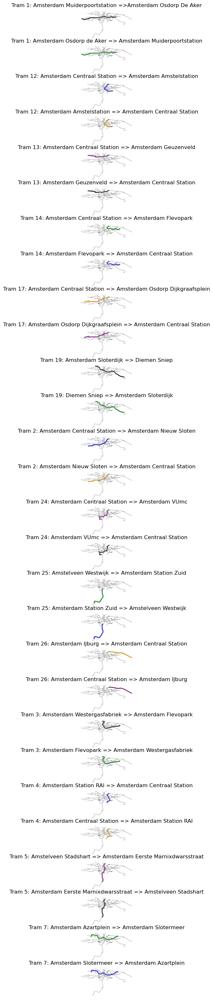

In [13]:
city_tram_order_route_dict, city_tram_shortest_path_pairs, city_tram_shortest_path_edges, tram_edges = tram(city_tram_stations, edges, nodes, city_tram_routes, city='Amsterdam')

<Axes: >

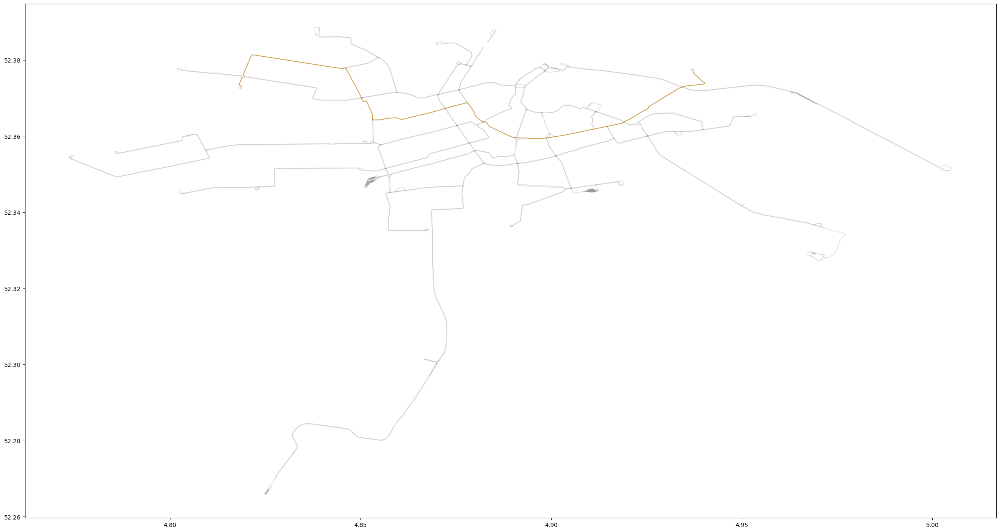

In [34]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(city_tram_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)

gpd.GeoDataFrame(city_tram_shortest_path_edges['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein'].copy()).plot(ax=ax, zorder=1, linewidth=(city_tram_shortest_path_edges['Tram 7: Amsterdam Slotermeer => Amsterdam Azartplein'].count_weight), color='orange')

In [14]:
tram_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to
0,7045610,"LINESTRING (4.9324018 52.3610615, 4.932387 52....",tram,None,0,0,1,28.561299,0.002040,28,"(0, 1)","(1, 0)"
1,7045616,"LINESTRING (4.934085 52.3609657, 4.9340765 52....",tram,None,1,2,3,146.082551,0.010434,146,"(2, 3)","(3, 2)"
2,7045675,"LINESTRING (4.9337809 52.3611734, 4.9339017 52...",tram,None,2,4,5,390.987463,0.027928,390,"(4, 5)","(5, 4)"
3,7045689,"LINESTRING (4.9394 52.361617, 4.9385742 52.361...",tram,None,3,6,7,345.247175,0.024661,345,"(6, 7)","(7, 6)"
4,7045994,"LINESTRING (4.9157261 52.365067, 4.9157046 52....",tram,None,4,8,1730,35.152166,0.002511,35,"(8, 1730)","(1730, 8)"
...,...,...,...,...,...,...,...,...,...,...,...,...
2199,1185084715,"LINESTRING (4.8520736 52.3479443, 4.8521852 52...",tram,None,2199,1496,594,11.280287,0.000806,11,"(1496, 594)","(594, 1496)"
2200,1185084716,"LINESTRING (4.852325 52.3480075, 4.852489 52.3...",tram,None,2200,562,1072,12.010525,0.000858,12,"(562, 1072)","(1072, 562)"
2201,1185084717,"LINESTRING (4.8516012 52.3470208, 4.8519064 52...",tram,None,2201,1497,561,81.765515,0.005840,81,"(1497, 561)","(561, 1497)"
2202,1185084718,"LINESTRING (4.8522982 52.348033, 4.8524709 52....",tram,None,2202,566,1079,12.587379,0.000899,12,"(566, 1079)","(1079, 566)"


## Add columns to nodes

In [15]:
city_tram_order_route_dict = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_order_route_dict, city_tram_routes)

In [16]:
city_tram_new_nodes = add_columns_to_nodes(city_tram_order_route_dict, nodes)

In [17]:
city_tram_new_nodes

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.93261 52.36080),2,1341,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (4.92894 52.36093),2,1503,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (4.92570 52.36012),2,1606,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (4.91674 52.35907),2,1612,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (4.91359 52.36235),2,1598,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
413,POINT (4.92630 52.36814),2,1559,Eerste Coehoornstraat,4.926300,52.368143,"(4.9263002, 52.3681426)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
414,POINT (4.92960 52.37020),2,1808,Eerste Leeghwaterstraat,4.929600,52.370198,"(4.9295997, 52.3701978)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
415,POINT (4.93483 52.37301),2,1515,Rietlandpark,4.934833,52.373011,"(4.9348327, 52.3730107)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"26, 7","26, 7"
416,POINT (4.93817 52.37346),2,1751,C. van Eesterenlaan,4.938170,52.373460,"(4.9381702, 52.3734596)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None


### retrive all transfer stations on each route

In [18]:
city_tram_transfer_stations_df = all_transfer_stations_df(city_tram_new_nodes)

In [19]:
city_tram_transfer_stations_df

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.93261 52.36080),2,1341,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (4.92894 52.36093),2,1503,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (4.92570 52.36012),2,1606,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (4.91674 52.35907),2,1612,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
4,POINT (4.91359 52.36235),2,1598,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
393,POINT (4.84859 52.37333),2,1642,Jan van Galenstraat,4.848589,52.373332,"(4.8485891, 52.3733319)",Tram 7: Amsterdam Azartplein => Amsterdam Slot...,tram,"13, 19, 7","13, 19, 7"
408,POINT (4.84872 52.37298),2,1802,Jan van Galenstraat,4.848724,52.372983,"(4.8487242, 52.3729826)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"13, 19, 7","13, 19, 7"
409,POINT (4.85007 52.37041),2,1888,Mercatorplein,4.850068,52.370406,"(4.8500681, 52.3704058)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"13, 7","13, 7"
411,POINT (4.91857 52.36337),2,1803,Alexanderplein,4.918568,52.363371,"(4.9185684, 52.3633708)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"14, 19, 7","14, 19, 7"


In [20]:
len(city_tram_transfer_stations_df)

183

## Add columns to edges

In [21]:
city_tram_shortest_path_edges = add_ref_to_orderroutes_or_shortestpath_dict(city_tram_shortest_path_edges, city_tram_routes)

In [22]:
city_tram_new_edges = add_columns_to_edges(city_tram_shortest_path_edges,edges)

In [23]:
column_to_drop = 'count_weight'
city_tram_new_edges = city_tram_new_edges.drop(columns=column_to_drop)

In [24]:
city_tram_new_edges

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref
0,7045610,"LINESTRING (4.9324018 52.3610615, 4.932387 52....",tram,None,0,0,1,28.561299,0.002040,28,"(0, 1)","(1, 0)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,1
1,7045616,"LINESTRING (4.934085 52.3609657, 4.9340765 52....",tram,None,1,2,3,146.082551,0.010434,146,"(2, 3)","(3, 2)",NaN,NaN,NaN
2,7045675,"LINESTRING (4.9337809 52.3611734, 4.9339017 52...",tram,None,2,4,5,390.987463,0.027928,390,"(4, 5)","(5, 4)",Tram 3: Amsterdam Westergasfabriek => Amsterda...,tram,3
3,7045689,"LINESTRING (4.9394 52.361617, 4.9385742 52.361...",tram,None,3,6,7,345.247175,0.024661,345,"(6, 7)","(7, 6)",Tram 3: Amsterdam Flevopark => Amsterdam Weste...,tram,3
4,7045994,"LINESTRING (4.9157261 52.365067, 4.9157046 52....",tram,None,4,8,1730,35.152166,0.002511,35,"(8, 1730)","(1730, 8)",Tram 14: Amsterdam Flevopark => Amsterdam Cent...,tram,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2199,1185084715,"LINESTRING (4.8520736 52.3479443, 4.8521852 52...",tram,None,2199,1496,594,11.280287,0.000806,11,"(1496, 594)","(594, 1496)",NaN,NaN,NaN
2200,1185084716,"LINESTRING (4.852325 52.3480075, 4.852489 52.3...",tram,None,2200,562,1072,12.010525,0.000858,12,"(562, 1072)","(1072, 562)",NaN,NaN,NaN
2201,1185084717,"LINESTRING (4.8516012 52.3470208, 4.8519064 52...",tram,None,2201,1497,561,81.765515,0.005840,81,"(1497, 561)","(561, 1497)",NaN,NaN,NaN
2202,1185084718,"LINESTRING (4.8522982 52.348033, 4.8524709 52....",tram,None,2202,566,1079,12.587379,0.000899,12,"(566, 1079)","(1079, 566)",NaN,NaN,NaN


# Create original points dataframe and OD pair list

In [25]:
origin_df = pd.DataFrame()
each_o_point = pd.DataFrame()
for route_name, station_df in city_tram_order_route_dict.items():
    each_o_point = station_df.loc[[0]]
    origin_df = pd.concat([origin_df,each_o_point])
origin_df.drop_duplicates(subset='geometry', inplace=True)
selected_columns = ['geometry','geo_x','geo_y','name']
origin_df = origin_df[selected_columns].reset_index(drop=True)
origin_df

,geometry,geo_x,geo_y,name
0,POINT (4.9326128 52.3607965),4.932613,52.360796,Muiderpoortstation
1,POINT (4.7747567 52.3537327),4.774757,52.353733,Matterhorn
2,POINT (4.8992878 52.3783193),4.899288,52.378319,Centraal Station
3,POINT (4.9178945 52.347445),4.917895,52.347445,Amstelstation
4,POINT (4.8992178 52.378303),4.899218,52.378303,Centraal Station
5,POINT (4.8029118 52.3772607),4.802912,52.377261,Lambertus Zijlplein
6,POINT (4.9003629 52.3778505),4.900363,52.377851,Centraal Station
7,POINT (4.9510568 52.3652467),4.951057,52.365247,Flevopark
8,POINT (4.8991546 52.3782813),4.899155,52.378281,Centraal Station
9,POINT (4.7864929 52.3554481),4.786493,52.355448,Dijkgraafplein


In [26]:
origin_name_df = origin_df[['name']]
origin_name_df

,name
0,Muiderpoortstation
1,Matterhorn
2,Centraal Station
3,Amstelstation
4,Centraal Station
5,Lambertus Zijlplein
6,Centraal Station
7,Flevopark
8,Centraal Station
9,Dijkgraafplein


In [27]:
merged_df = pd.merge(city_tram_new_nodes,origin_name_df, on='name', how='left', indicator=True)
destination_df = merged_df[merged_df['_merge'] == 'left_only'].drop('_merge', axis=1).reset_index(drop=True)
destination_df

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.92894 52.36093),2,1503,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
1,POINT (4.92570 52.36012),2,1606,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
2,POINT (4.91674 52.35907),2,1612,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"
3,POINT (4.91359 52.36235),2,1598,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
4,POINT (4.90712 52.36100),2,1580,Weesperplein,4.907121,52.361002,"(4.9071213, 52.3610021)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7"
...,...,...,...,...,...,...,...,...,...,...,...
368,POINT (4.92481 52.36687),2,1574,Hoogte Kadijk,4.924812,52.366868,"(4.9248123, 52.3668676)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
369,POINT (4.92630 52.36814),2,1559,Eerste Coehoornstraat,4.926300,52.368143,"(4.9263002, 52.3681426)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
370,POINT (4.92960 52.37020),2,1808,Eerste Leeghwaterstraat,4.929600,52.370198,"(4.9295997, 52.3701978)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None
371,POINT (4.93483 52.37301),2,1515,Rietlandpark,4.934833,52.373011,"(4.9348327, 52.3730107)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"26, 7","26, 7"


In [28]:
OD_list = []

for index_origin, row_origin in origin_df.iterrows():
    o_geo_x = row_origin['geo_x']
    o_geo_y = row_origin['geo_y']
       
    for index_destination, row_destination in destination_df.iterrows():
        d_geo_x = row_destination['geo_x']
        d_geo_y = row_destination['geo_y']
        
        # Append a dictionary to the list
        OD_list.append({
            's_coordinates_x': o_geo_x,
            's_coordinates_y': o_geo_y,
            'e_coordinates_x': d_geo_x,
            'e_coordinates_y': d_geo_y
        })

# Create a DataFrame from the list of dictionaries
OD_df = pd.DataFrame(OD_list)  
OD_df

,s_coordinates_x,s_coordinates_y,e_coordinates_x,e_coordinates_y
0,4.932613,52.360796,4.928942,52.360931
1,4.932613,52.360796,4.925703,52.360116
2,4.932613,52.360796,4.916742,52.359073
3,4.932613,52.360796,4.913592,52.362348
4,4.932613,52.360796,4.907121,52.361002
...,...,...,...,...
10066,4.818602,52.372845,4.924812,52.366868
10067,4.818602,52.372845,4.926300,52.368143
10068,4.818602,52.372845,4.929600,52.370198
10069,4.818602,52.372845,4.934833,52.373011


In [29]:
def test_OD_metro(OD_df,city_sub_new_nodes,city_sub_new_edges,city_sub_routes,city_sub_order_route_dict):
    
    for index, row in OD_df.iterrows():
        OD_pair = pd.Series(row)
        start_node, end_node = s_e_node_df(OD_pair, city_sub_new_nodes)
       
        s_on_route_ref,e_on_route_ref = s_e_on_route_ref(start_node, end_node)
        s_on_route_ref, e_on_route_ref = judge_on_route(s_on_route_ref, e_on_route_ref)
        s_e_same_routes_df = s_e_same_routes(s_on_route_ref,e_on_route_ref)
        if s_e_same_routes_df is None:
            t_station_node = transfer_station_one_mode(city_sub_routes, start_node, end_node, city_sub_new_nodes, city_sub_order_route_dict)
            
            s_on_route_ref,t_on_route_ref = s_e_on_route_ref(start_node, t_station_node)
            s_t_same_routes_df = s_e_same_routes(s_on_route_ref,t_on_route_ref)
            all_stations_on_matched_routes_dfs_s_t = all_stations_on_matched_routes(s_t_same_routes_df,city_sub_routes,start_node,t_station_node,city_sub_order_route_dict)
            btw_stations_each_way_list_s_t = btw_stations_each_way_list(start_node,t_station_node,all_stations_on_matched_routes_dfs_s_t)
            
            t_on_route_ref,e_on_route_ref = s_e_on_route_ref( t_station_node,end_node)
            t_e_same_routes_df = s_e_same_routes(t_on_route_ref,e_on_route_ref)
            all_stations_on_matched_routes_dfs_t_e = all_stations_on_matched_routes(t_e_same_routes_df,city_sub_routes,t_station_node,end_node,city_sub_order_route_dict)
            btw_stations_each_way_list_t_e = btw_stations_each_way_list(t_station_node,end_node,all_stations_on_matched_routes_dfs_t_e)
            
            btw_all_id_pairs_list_s_t = btw_all_ids_pairs(btw_stations_each_way_list_s_t,city_sub_new_nodes)
            btw_all_id_pairs_list_t_e = btw_all_ids_pairs(btw_stations_each_way_list_t_e,city_sub_new_nodes)
            
            btw_all_id_pairs_list_unique_s_t = drop_df_in_list(btw_all_id_pairs_list_s_t)
            btw_all_id_pairs_list_unique_t_e = drop_df_in_list(btw_all_id_pairs_list_t_e)

            G = create_ground_graph(city_sub_new_edges, city_sub_new_nodes)
            shortest_path_pairs_way_s_t = all_shortest_paths(G, btw_all_id_pairs_list_unique_s_t[0], city_sub_new_edges)
            duplicate_row_count_way_s_t, shortest_path_edges_way_s_t, edges_way_s_t = edges_with_count_weight(shortest_path_pairs_way_s_t, city_sub_new_edges)
            shortest_path_pairs_way_t_e = all_shortest_paths(G, btw_all_id_pairs_list_unique_t_e[0], city_sub_new_edges)
            duplicate_row_count_way_t_e, shortest_path_edges_way_t_e, edges_way_t_e = edges_with_count_weight(shortest_path_pairs_way_t_e, city_sub_new_edges)
            shortest_path_edges_way = pd.concat([shortest_path_edges_way_s_t,shortest_path_edges_way_t_e])
            

            fig, ax = plt.subplots(1, 1, figsize=(30, 20))
            gpd.GeoDataFrame(city_sub_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
            gpd.GeoDataFrame(shortest_path_edges_way.copy()).plot(ax=ax, zorder=1, linewidth=(shortest_path_edges_way.count_weight), color='orange')
            print(index)
        else:
            start_node_gdf,s_e_on_same_route_gdf = s_e_same_route_gdf_metro(s_e_same_routes_df,city_sub_routes,start_node)
        
            all_btw_stations_on_same_route_gdf = all_btw_stations_on_same_route_gdf_metro(city_sub_order_route_dict, s_e_on_same_route_gdf, start_node, end_node)
            btw_all_id_pairs_list = btw_all_ids_pairs_transfer_all(all_btw_stations_on_same_route_gdf,city_sub_new_nodes)
            btw_all_id_pairs_list_unique = drop_df_in_list(btw_all_id_pairs_list)
            G = create_ground_graph(city_sub_new_edges, city_sub_new_nodes)
            shortest_path_pairs_way = all_shortest_paths(G, btw_all_id_pairs_list_unique[0], city_sub_new_edges)
            duplicate_row_count_way, shortest_path_edges_way, edges_way = edges_with_count_weight(shortest_path_pairs_way, city_sub_new_nodes)
            fig, ax = plt.subplots(1, 1, figsize=(30, 20))
            gpd.GeoDataFrame(city_sub_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)
            gpd.GeoDataFrame(shortest_path_edges_way.copy()).plot(ax=ax, zorder=1, linewidth=(shortest_path_edges_way.count_weight), color='orange')
            print(index)

s_node and e_node are on several same routes.
The next step is to find the same routes ---- using function 's_e_same_routes'
s_node and e_node are on same route/routes:   ref
0   1
1   3

All dataframes in the list are the same
0
s_node and e_node are on several same routes.
The next step is to find the same routes ---- using function 's_e_same_routes'
s_node and e_node are on same route/routes:   ref
0   1
1   3

All dataframes in the list are the same
1
s_node and e_node are on several same routes.
The next step is to find the same routes ---- using function 's_e_same_routes'
s_node and e_node are on same route/routes:   ref
0   1
1   3

All dataframes in the list are the same
2
Some of e_on_route is the same as some of s_on_route.
The next step is to find the same routes ---- using function 's_e_same_routes'
s_node and e_node are on same route/routes:   ref
0   1

All dataframes in the list are the same
3
Some of e_on_route is the same as some of s_on_route.
The next step is to find

KeyError: 0

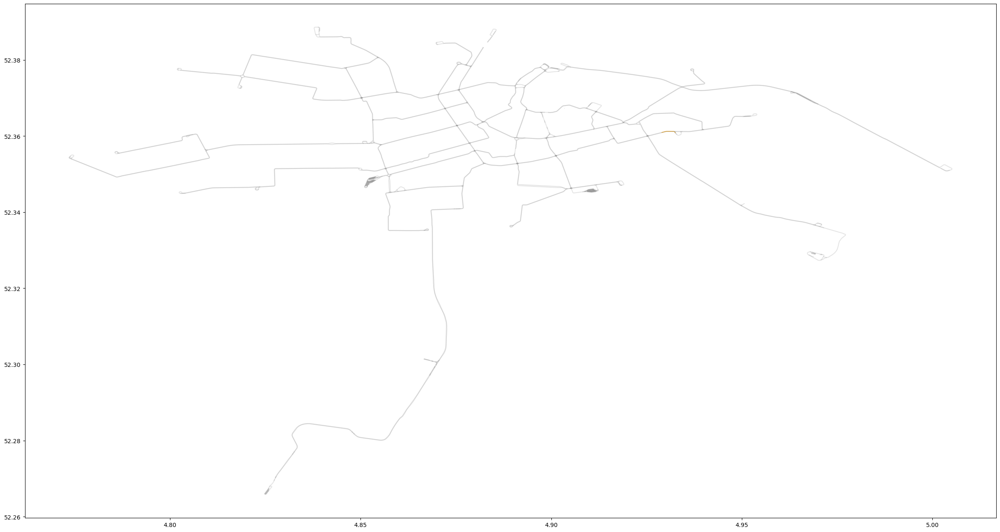

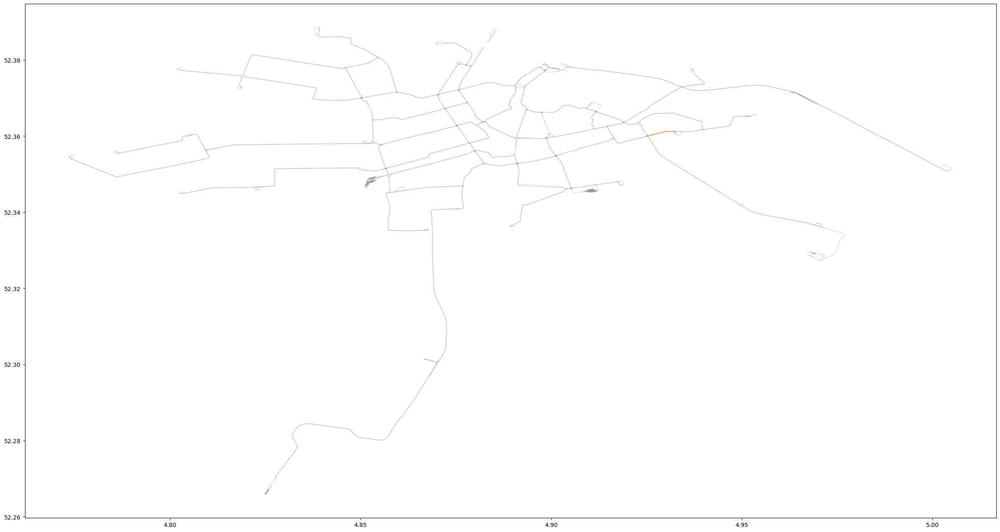

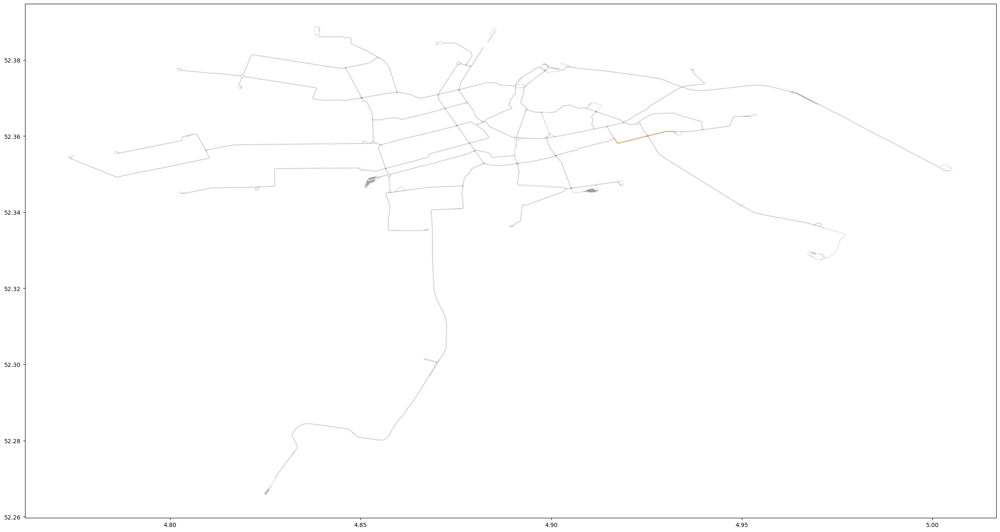

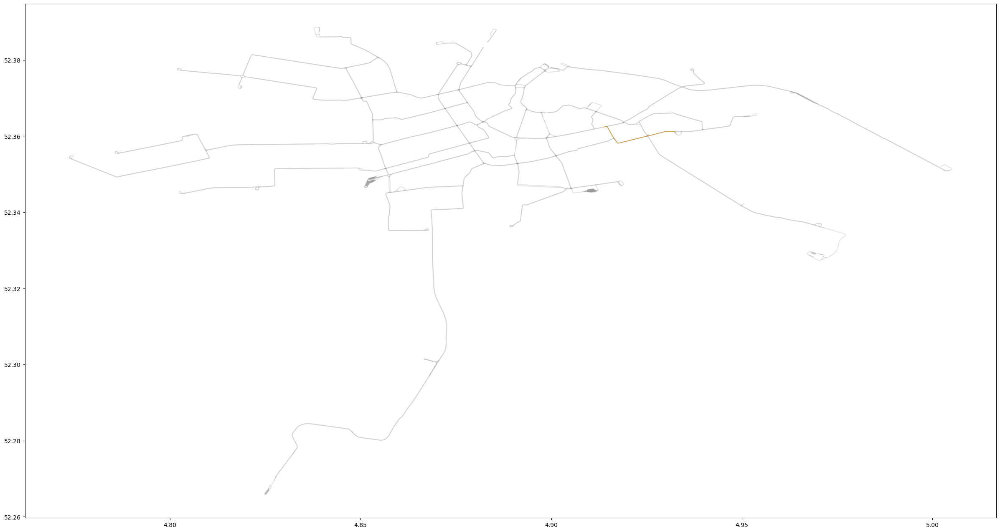

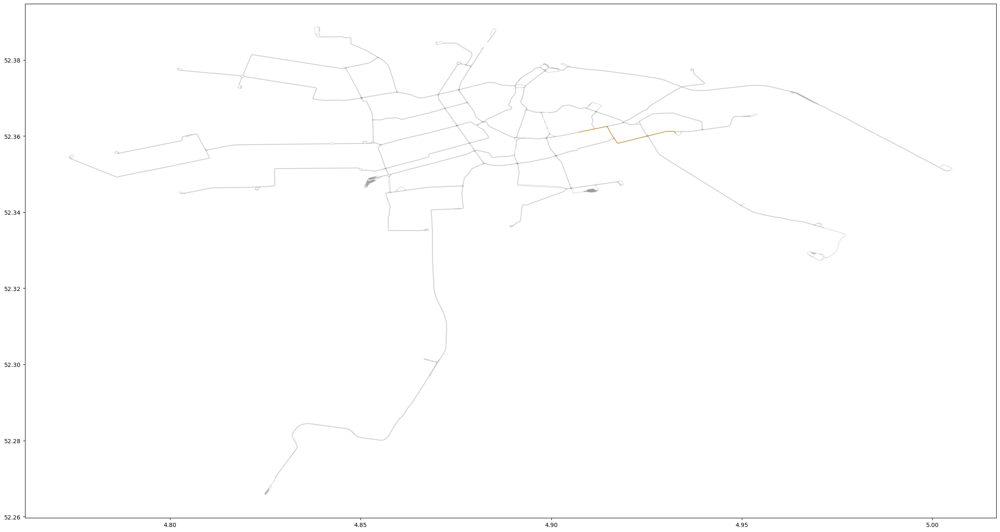

...

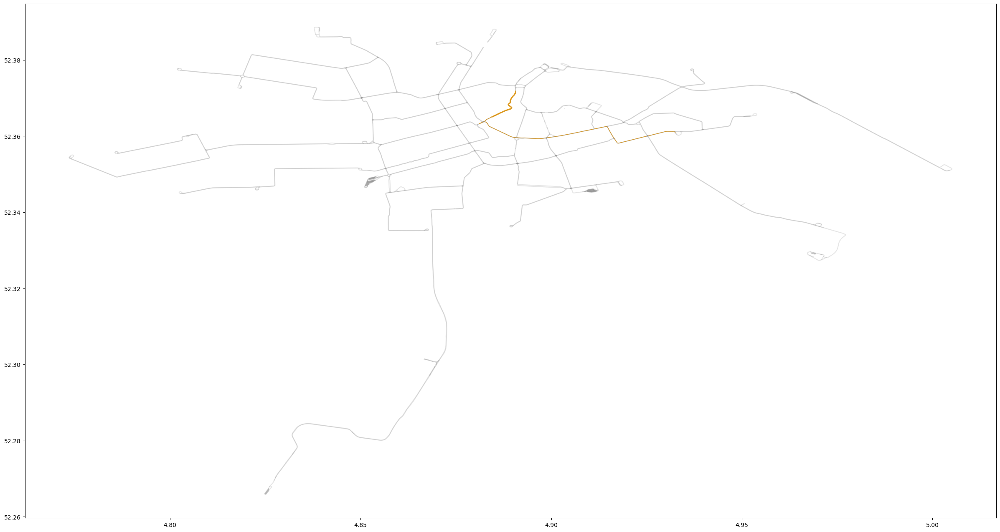

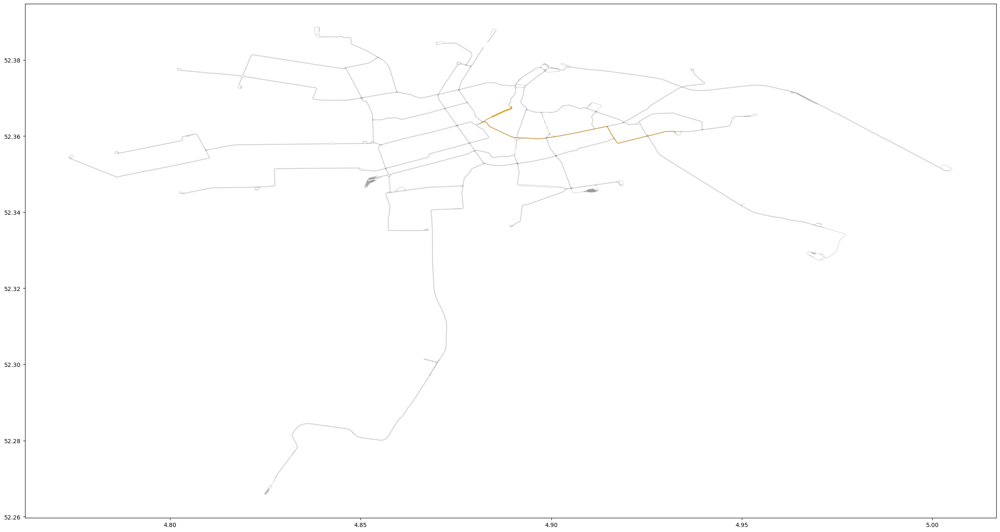

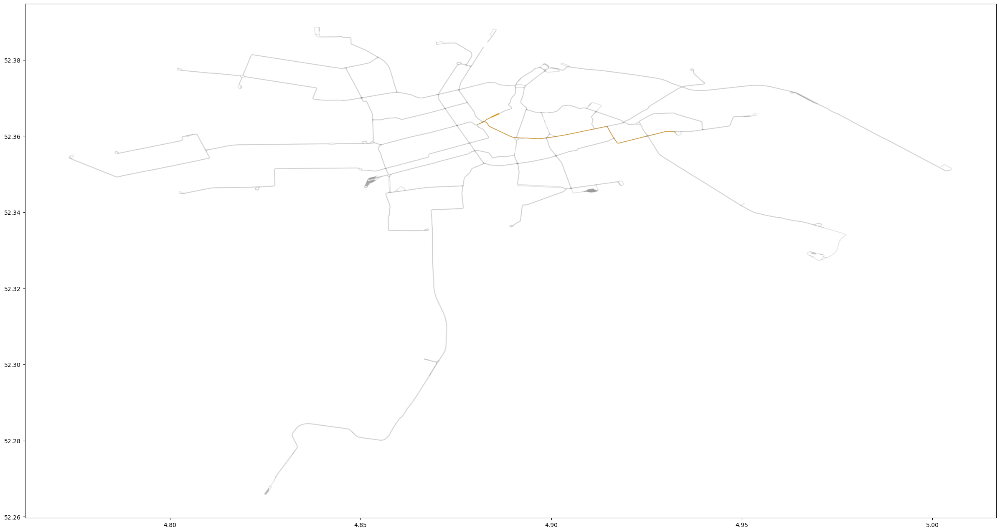

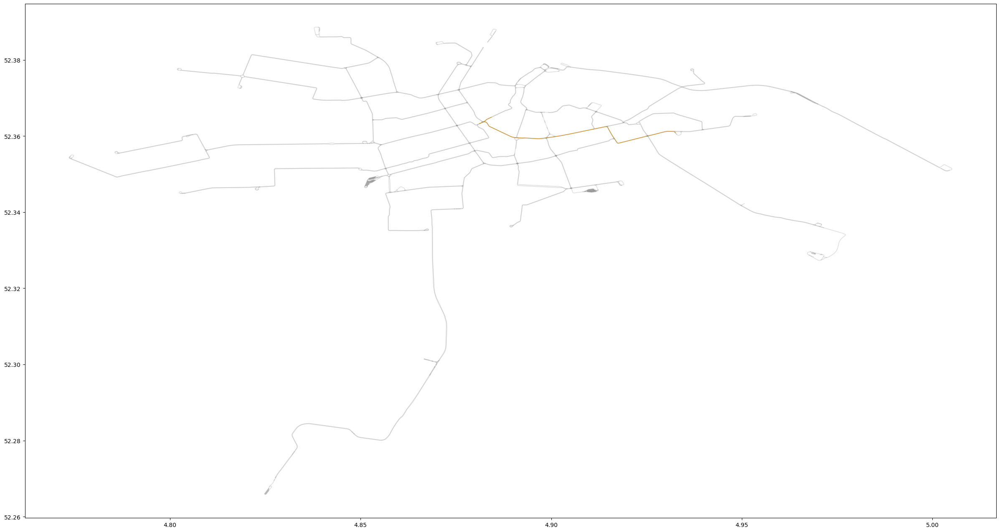

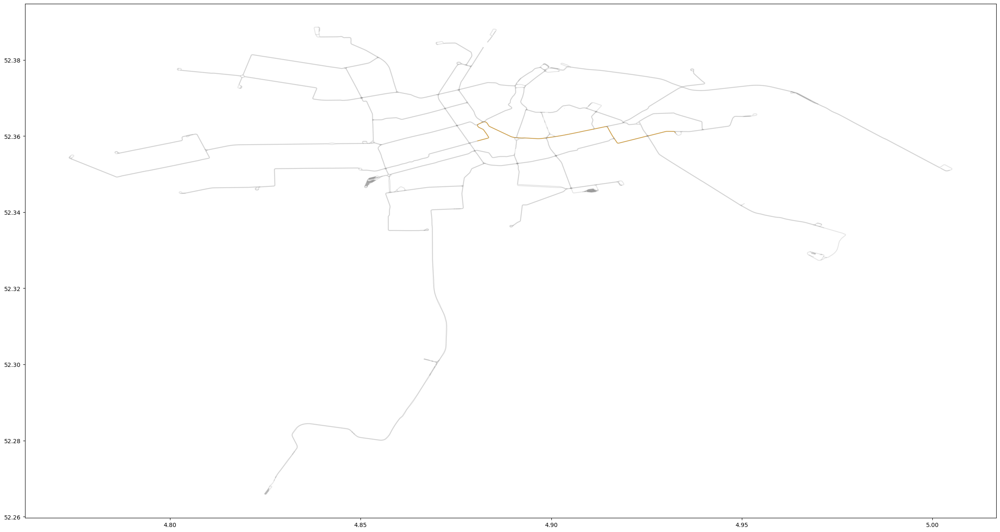

In [30]:
test_OD_metro(OD_df,city_tram_new_nodes,city_tram_new_edges,city_tram_routes,city_tram_order_route_dict)

# Test 1:

In [31]:
start_node, end_node = s_e_node_df(OD_df.iloc[53], city_tram_new_nodes)

In [32]:
start_node

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
0,POINT (4.93261 52.36080),2,1341,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3"


In [33]:
end_node

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
58,POINT (4.87980 52.35641),2,1673,Concertgebouw,4.8798,52.356411,"(4.8798, 52.3564107)",Tram 12: Amsterdam Centraal Station => Amsterd...,tram,"12, 3, 5","12, 3, 5"


In [96]:
tram_routes_gdf = gpd.GeoDataFrame(city_tram_routes.copy())
s_node_gdf = gpd.GeoDataFrame(start_node.copy())
e_node_gdf = gpd.GeoDataFrame(end_node.copy())

In [73]:
s_node_on_route_gdf = tram_routes_gdf[tram_routes_gdf.geometry.intersects(s_node_gdf.iloc[0].geometry)]
s_node_on_route_gdf

,osm_id,route,to,name,ref,network,service,geometry
2,31249,subway,Isolatorweg,Metro 51: Centraal Station => Isolatorweg,51,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.90193 52.37689, 4.90202 52..."
6,18532,subway,Gaasperplas,Metro 53: Centraal Station => Gaasperplas,53,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.90193 52.37689, 4.90202 52..."
8,18423,subway,Gein,Metro 54: Centraal Station => Gein,54,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.90193 52.37689, 4.90202 52..."


In [74]:
e_node_on_route_gdf = tram_routes_gdf[tram_routes_gdf.geometry.intersects(e_node_gdf.iloc[0].geometry)]
e_node_on_route_gdf

,osm_id,route,to,name,ref,network,service,geometry
4,8466667,subway,Zuid,Metro 52: Noord => Zuid,52,Stadsvervoer Amsterdam,None,"MULTILINESTRING ((4.93265 52.40228, 4.93269 52..."


### Find the route which the s_e nodes are on----compare with new_edges instead of routes dataframe, should compare with routes dataframe

In [75]:
s_on_route_ref,e_on_route_ref = s_e_on_route_ref(start_node, end_node)

### Make judgement of s_e_on_route_ref

In [76]:
s_on_route_ref, e_on_route_ref = judge_on_route(s_on_route_ref, e_on_route_ref)

One of s_on_route is the same as e_on_route.
The next step is to find the same routes ---- using function 's_e_same_routes'


In [77]:
s_on_route_ref

,ref
0,51
1,52
2,53
3,54


In [78]:
e_on_route_ref

,ref
0,52


### Find those same routes

In [79]:
s_e_same_routes_df = s_e_same_routes(s_on_route_ref,e_on_route_ref)
s_e_same_routes_df

s_node and e_node are on same route/routes:   ref
1  52



,ref
1,52


In [80]:
s_e_same_routes_df

,ref
1,52


### Find transfer stations----transfer_station_one_mode

In [81]:
t_station_node = transfer_station_one_mode(city_tram_routes, start_node, end_node, city_tram_new_nodes, city_tram_order_route_dict)

In [82]:
t_station_node

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer
40,POINT (4.90087 52.37735),2,731,Centraal Station,4.900869,52.377355,"(4.9008686, 52.3773546)",Metro 51: Centraal Station => Isolatorweg,subway,"51, 52, 53, 54","51, 52, 53, 54"


### Get all stations between s_e nodes and transfer nodes

In [83]:
s_on_route_ref,t_on_route_ref = s_e_on_route_ref(start_node, t_station_node)

In [84]:
s_t_same_routes_df = s_e_same_routes(s_on_route_ref,t_on_route_ref)
s_t_same_routes_df

s_node and e_node are on same route/routes:   ref
0  51
1  52
2  53
3  54



,ref
0,51
1,52
2,53
3,54


In [85]:
all_stations_on_matched_routes_dfs_s_t = all_stations_on_matched_routes(s_t_same_routes_df,city_tram_routes,start_node,t_station_node,city_tram_order_route_dict)
all_stations_on_matched_routes_dfs_s_t

[    id                 name                      geometry     geo_x  \
 0    4     Centraal Station  POINT (4.9008686 52.3773546)  4.900869   
 1   17           Nieuwmarkt  POINT (4.9009379 52.3714238)  4.900938   
 2   16        Waterlooplein  POINT (4.9036061 52.3666363)  4.903606   
 3   18         Weesperplein  POINT (4.9078472 52.3613094)  4.907847   
 4    3         Wibautstraat  POINT (4.9118953 52.3545601)  4.911895   
 5    5        Amstelstation  POINT (4.9174059 52.3466361)  4.917406   
 6    6           Spaklerweg  POINT (4.9208004 52.3402348)    4.9208   
 7    8           Overamstel  POINT (4.9176682 52.3316938)  4.917668   
 8   15          Station RAI    POINT (4.889539 52.337689)  4.889539   
 9    9                 Zuid  POINT (4.8739633 52.3393223)  4.873963   
 10   7      Amstelveenseweg  POINT (4.8575709 52.3384751)  4.857571   
 11  10    Henk Sneevlietweg  POINT (4.8345741 52.3463868)  4.834574   
 12   2      Heemstedestraat   POINT (4.834401 52.3523291)  4.83

In [86]:
btw_stations_each_way_list_s_t = btw_stations_each_way_list(start_node,t_station_node,all_stations_on_matched_routes_dfs_s_t)
btw_stations_each_way_list_s_t

[  id              name                      geometry     geo_x      geo_y  \
 0  4  Centraal Station  POINT (4.9008686 52.3773546)  4.900869  52.377355   
 
                              route_name_list ref   route  \
 0  Metro 51: Centraal Station => Isolatorweg  51  subway   
 
           coordinate_value  order_index  
 0  (4.9008686, 52.3773546)            0  ,
   id              name                      geometry     geo_x      geo_y  \
 0  6  Centraal Station  POINT (4.9008686 52.3773546)  4.900869  52.377355   
 
                              route_name_list ref   route  \
 0  Metro 53: Centraal Station => Gaasperplas  53  subway   
 
           coordinate_value  
 0  (4.9008686, 52.3773546)  ,
   id              name                      geometry     geo_x      geo_y  \
 0  2  Centraal Station  POINT (4.9008686 52.3773546)  4.900869  52.377355   
 
                       route_name_list ref   route         coordinate_value  
 0  Metro 54: Centraal Station => Gein  54  subway  

In [87]:
t_on_route_ref,e_on_route_ref = s_e_on_route_ref( t_station_node,end_node)

In [88]:
t_e_same_routes_df = s_e_same_routes(t_on_route_ref,e_on_route_ref)
t_e_same_routes_df

s_node and e_node are on same route/routes:   ref
1  52



,ref
1,52


In [89]:
all_stations_on_matched_routes_dfs_t_e = all_stations_on_matched_routes(t_e_same_routes_df,city_tram_routes,t_station_node,end_node,city_tram_order_route_dict)
all_stations_on_matched_routes_dfs_t_e

[  id              name                      geometry     geo_x      geo_y  \
 0  2             Noord   POINT (4.932402 52.4021571)  4.932402  52.402157   
 1  3       Noorderpark  POINT (4.9181114 52.3886982)  4.918111  52.388698   
 2  1  Centraal Station  POINT (4.9008785 52.3792082)  4.900879  52.379208   
 3  0             Rokin  POINT (4.8925639 52.3705391)  4.892564  52.370539   
 4  6      Vijzelgracht  POINT (4.8910469 52.3606866)  4.891047  52.360687   
 5  8           De Pijp  POINT (4.8906487 52.3539577)  4.890649  52.353958   
 6  5       Europaplein  POINT (4.8915605 52.3411785)   4.89156  52.341178   
 7  4              Zuid  POINT (4.8772326 52.3393181)  4.877233  52.339318   
 
            route_name_list ref   route         coordinate_value  
 0  Metro 52: Noord => Zuid  52  subway   (4.932402, 52.4021571)  
 1  Metro 52: Noord => Zuid  52  subway  (4.9181114, 52.3886982)  
 2  Metro 52: Noord => Zuid  52  subway  (4.9008785, 52.3792082)  
 3  Metro 52: Noord => Zuid 

In [90]:
btw_stations_each_way_list_t_e = btw_stations_each_way_list(t_station_node,end_node,all_stations_on_matched_routes_dfs_t_e)
btw_stations_each_way_list_t_e

[  id              name                      geometry     geo_x      geo_y  \
 2  1  Centraal Station  POINT (4.9008785 52.3792082)  4.900879  52.379208   
 1  3       Noorderpark  POINT (4.9181114 52.3886982)  4.918111  52.388698   
 
            route_name_list ref   route         coordinate_value  
 2  Metro 52: Noord => Zuid  52  subway  (4.9008785, 52.3792082)  
 1  Metro 52: Noord => Zuid  52  subway  (4.9181114, 52.3886982)  ]

### Get all nodes and id_pairs of nodes between s_e nodes

In [91]:
btw_all_id_pairs_list_s_t = btw_all_ids_pairs(btw_stations_each_way_list_s_t,city_tram_new_nodes)
btw_all_id_pairs_list_s_t

[Empty DataFrame
 Columns: [s_id, e_id]
 Index: [],
 Empty DataFrame
 Columns: [s_id, e_id]
 Index: [],
 Empty DataFrame
 Columns: [s_id, e_id]
 Index: []]

In [92]:
btw_all_id_pairs_list_t_e = btw_all_ids_pairs(btw_stations_each_way_list_t_e,city_tram_new_nodes)
btw_all_id_pairs_list_t_e

[  s_id e_id
 0  818  816]

### Calculate shortest path and plot

In [55]:
btw_all_id_pairs_list_unique_s_t = drop_df_in_list(btw_all_id_pairs_list_s_t)

All dataframes in the list are the same


In [56]:
btw_all_id_pairs_list_unique_t_e = drop_df_in_list(btw_all_id_pairs_list_t_e)

All dataframes in the list are the same


In [57]:
G = create_ground_graph(city_tram_new_edges, city_tram_new_nodes)

In [58]:
shortest_path_pairs_way_s_t = all_shortest_paths(G, btw_all_id_pairs_list_unique_s_t[0], city_tram_new_edges)

In [59]:
shortest_path_pairs_way_s_t

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref
358,166187911,"LINESTRING (4.9823107 52.2963387, 4.9838859 52...",subway,None,358,317,634,107.447350,0.004298,107,"(317, 634)","(634, 317)",Metro 50: Gein => Isolatorweg,subway,"50, 54"
362,166187914,"LINESTRING (4.9850607 52.2963027, 4.9855227 52...",subway,None,362,322,655,57.734405,0.002309,57,"(322, 655)","(655, 322)",Metro 50: Gein => Isolatorweg,subway,"50, 54"
367,166187917,"LINESTRING (4.9871059 52.2963808, 4.9873266 52...",subway,None,367,654,328,140.227871,0.005609,140,"(654, 328)","(328, 654)",Metro 50: Gein => Isolatorweg,subway,"50, 54"
368,166187918,"LINESTRING (4.9776921 52.2962066, 4.9783293 52...",subway,None,368,329,330,272.415707,0.010897,272,"(329, 330)","(330, 329)",Metro 50: Gein => Isolatorweg,subway,"50, 54"
372,166187922,"LINESTRING (4.9847395 52.2963009, 4.9850607 52...",subway,None,372,336,322,21.910518,0.000876,21,"(336, 322)","(322, 336)",Metro 50: Gein => Isolatorweg,subway,"50, 54"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
556,377542511,"LINESTRING (4.8871543 52.3386815, 4.88686 52.3...",subway,None,556,473,740,185.101260,0.007404,185,"(473, 740)","(740, 473)",Metro 50: Gein => Isolatorweg,subway,"50, 51"
561,377542515,"LINESTRING (4.8836726 52.3394002, 4.8829839 52...",subway,crossover,561,474,475,160.353413,0.006414,160,"(474, 475)","(475, 474)",Metro 50: Gein => Isolatorweg,subway,"50, 51"
562,377542515,"LINESTRING (4.8813282 52.3394866, 4.8787859 52...",subway,crossover,562,475,467,260.545963,0.010422,260,"(475, 467)","(467, 475)",Metro 50: Gein => Isolatorweg,subway,"50, 51"
850,609899762,"LINESTRING (4.8846464 52.3393094, 4.8844549 52...",subway,crossover,851,740,474,67.186838,0.002687,67,"(740, 474)","(474, 740)",Metro 50: Gein => Isolatorweg,subway,"50, 51"


In [60]:
duplicate_row_count_way_s_t, shortest_path_edges_way_s_t, edges_way_s_t = edges_with_count_weight(shortest_path_pairs_way_s_t, city_tram_new_edges)

In [61]:
shortest_path_edges_way_s_t

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref,count_weight
0,166187911,"LINESTRING (4.9823107 52.2963387, 4.9838859 52...",subway,None,358,317,634,107.447350,0.004298,107,"(317, 634)","(634, 317)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
1,166187914,"LINESTRING (4.9850607 52.2963027, 4.9855227 52...",subway,None,362,322,655,57.734405,0.002309,57,"(322, 655)","(655, 322)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
2,166187917,"LINESTRING (4.9871059 52.2963808, 4.9873266 52...",subway,None,367,654,328,140.227871,0.005609,140,"(654, 328)","(328, 654)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
3,166187918,"LINESTRING (4.9776921 52.2962066, 4.9783293 52...",subway,None,368,329,330,272.415707,0.010897,272,"(329, 330)","(330, 329)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
4,166187922,"LINESTRING (4.9847395 52.2963009, 4.9850607 52...",subway,None,372,336,322,21.910518,0.000876,21,"(336, 322)","(322, 336)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92,377542511,"LINESTRING (4.8871543 52.3386815, 4.88686 52.3...",subway,None,556,473,740,185.101260,0.007404,185,"(473, 740)","(740, 473)",Metro 50: Gein => Isolatorweg,subway,"50, 51",1.0
93,377542515,"LINESTRING (4.8836726 52.3394002, 4.8829839 52...",subway,crossover,561,474,475,160.353413,0.006414,160,"(474, 475)","(475, 474)",Metro 50: Gein => Isolatorweg,subway,"50, 51",1.0
94,377542515,"LINESTRING (4.8813282 52.3394866, 4.8787859 52...",subway,crossover,562,475,467,260.545963,0.010422,260,"(475, 467)","(467, 475)",Metro 50: Gein => Isolatorweg,subway,"50, 51",1.0
95,609899762,"LINESTRING (4.8846464 52.3393094, 4.8844549 52...",subway,crossover,851,740,474,67.186838,0.002687,67,"(740, 474)","(474, 740)",Metro 50: Gein => Isolatorweg,subway,"50, 51",1.0


In [62]:
shortest_path_pairs_way_t_e = all_shortest_paths(G, btw_all_id_pairs_list_unique_t_e[0], city_tram_new_edges)

In [63]:
shortest_path_pairs_way_t_e

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref
192,159843925,"LINESTRING (4.8868 52.3386749, 4.8869727 52.33...",subway,None,192,176,177,103.917651,0.004157,103,"(176, 177)","(177, 176)",Metro 52: Zuid => Noord,subway,52
385,166274058,"LINESTRING (4.8780248 52.3393025, 4.8781477 52...",subway,None,385,345,471,189.905363,0.007596,189,"(345, 471)","(471, 345)",Metro 52: Zuid => Noord,subway,52
386,166274058,"LINESTRING (4.880809 52.3393743, 4.8815713 52....",subway,None,386,471,469,51.965630,0.002079,51,"(471, 469)","(469, 471)",Metro 52: Zuid => Noord,subway,52
387,166274058,"LINESTRING (4.8815713 52.3393871, 4.8821183 52...",subway,None,387,469,176,368.529000,0.014741,368,"(469, 176)","(176, 469)",Metro 52: Zuid => Noord,subway,52
552,377542472,"LINESTRING (4.8882296 52.3383541, 4.8883836 52...",subway,None,552,177,465,47.119934,0.001885,47,"(177, 465)","(465, 177)",Metro 52: Zuid => Noord,subway,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
884,691060921,"LINESTRING (4.8914715 52.3613466, 4.8915363 52...",subway,None,885,766,767,56.891191,0.002276,56,"(766, 767)","(767, 766)",Metro 52: Zuid => Noord,subway,52
885,691060922,"LINESTRING (4.891674 52.3618427, 4.8917094 52....",subway,None,886,767,768,9.565065,0.000383,9,"(767, 768)","(768, 767)",Metro 52: Zuid => Noord,subway,52
886,691060923,"LINESTRING (4.8917094 52.3619259, 4.8919772 52...",subway,None,887,768,769,132.425376,0.005297,132,"(768, 769)","(769, 768)",Metro 52: Zuid => Noord,subway,52
887,691060924,"LINESTRING (4.89218 52.3630807, 4.8929694 52.3...",subway,None,888,769,770,259.965339,0.010399,259,"(769, 770)","(770, 769)",Metro 52: Zuid => Noord,subway,52


In [64]:
duplicate_row_count_way_t_e, shortest_path_edges_way_t_e, edges_way_t_e = edges_with_count_weight(shortest_path_pairs_way_t_e, city_tram_new_edges)

In [65]:
shortest_path_edges_way_t_e

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref,count_weight
0,159843925,"LINESTRING (4.8868 52.3386749, 4.8869727 52.33...",subway,None,192,176,177,103.917651,0.004157,103,"(176, 177)","(177, 176)",Metro 52: Zuid => Noord,subway,52,2.0
1,166274058,"LINESTRING (4.8780248 52.3393025, 4.8781477 52...",subway,None,385,345,471,189.905363,0.007596,189,"(345, 471)","(471, 345)",Metro 52: Zuid => Noord,subway,52,1.0
2,166274058,"LINESTRING (4.880809 52.3393743, 4.8815713 52....",subway,None,386,471,469,51.965630,0.002079,51,"(471, 469)","(469, 471)",Metro 52: Zuid => Noord,subway,52,2.0
3,166274058,"LINESTRING (4.8815713 52.3393871, 4.8821183 52...",subway,None,387,469,176,368.529000,0.014741,368,"(469, 176)","(176, 469)",Metro 52: Zuid => Noord,subway,52,2.0
4,377542472,"LINESTRING (4.8882296 52.3383541, 4.8883836 52...",subway,None,552,177,465,47.119934,0.001885,47,"(177, 465)","(465, 177)",Metro 52: Zuid => Noord,subway,52,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,691060921,"LINESTRING (4.8914715 52.3613466, 4.8915363 52...",subway,None,885,766,767,56.891191,0.002276,56,"(766, 767)","(767, 766)",Metro 52: Zuid => Noord,subway,52,2.0
72,691060922,"LINESTRING (4.891674 52.3618427, 4.8917094 52....",subway,None,886,767,768,9.565065,0.000383,9,"(767, 768)","(768, 767)",Metro 52: Zuid => Noord,subway,52,2.0
73,691060923,"LINESTRING (4.8917094 52.3619259, 4.8919772 52...",subway,None,887,768,769,132.425376,0.005297,132,"(768, 769)","(769, 768)",Metro 52: Zuid => Noord,subway,52,2.0
74,691060924,"LINESTRING (4.89218 52.3630807, 4.8929694 52.3...",subway,None,888,769,770,259.965339,0.010399,259,"(769, 770)","(770, 769)",Metro 52: Zuid => Noord,subway,52,2.0


In [66]:
shortest_path_edges_way = pd.concat([shortest_path_edges_way_s_t,shortest_path_edges_way_t_e])
shortest_path_edges_way

,osm_id,geometry,railway,service,id,from_id,to_id,distance,time,weights,to_from,from_to,route_name_list,route,ref,count_weight
0,166187911,"LINESTRING (4.9823107 52.2963387, 4.9838859 52...",subway,None,358,317,634,107.447350,0.004298,107,"(317, 634)","(634, 317)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
1,166187914,"LINESTRING (4.9850607 52.2963027, 4.9855227 52...",subway,None,362,322,655,57.734405,0.002309,57,"(322, 655)","(655, 322)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
2,166187917,"LINESTRING (4.9871059 52.2963808, 4.9873266 52...",subway,None,367,654,328,140.227871,0.005609,140,"(654, 328)","(328, 654)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
3,166187918,"LINESTRING (4.9776921 52.2962066, 4.9783293 52...",subway,None,368,329,330,272.415707,0.010897,272,"(329, 330)","(330, 329)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
4,166187922,"LINESTRING (4.9847395 52.2963009, 4.9850607 52...",subway,None,372,336,322,21.910518,0.000876,21,"(336, 322)","(322, 336)",Metro 50: Gein => Isolatorweg,subway,"50, 54",1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,691060921,"LINESTRING (4.8914715 52.3613466, 4.8915363 52...",subway,None,885,766,767,56.891191,0.002276,56,"(766, 767)","(767, 766)",Metro 52: Zuid => Noord,subway,52,2.0
72,691060922,"LINESTRING (4.891674 52.3618427, 4.8917094 52....",subway,None,886,767,768,9.565065,0.000383,9,"(767, 768)","(768, 767)",Metro 52: Zuid => Noord,subway,52,2.0
73,691060923,"LINESTRING (4.8917094 52.3619259, 4.8919772 52...",subway,None,887,768,769,132.425376,0.005297,132,"(768, 769)","(769, 768)",Metro 52: Zuid => Noord,subway,52,2.0
74,691060924,"LINESTRING (4.89218 52.3630807, 4.8929694 52.3...",subway,None,888,769,770,259.965339,0.010399,259,"(769, 770)","(770, 769)",Metro 52: Zuid => Noord,subway,52,2.0


<Axes: >

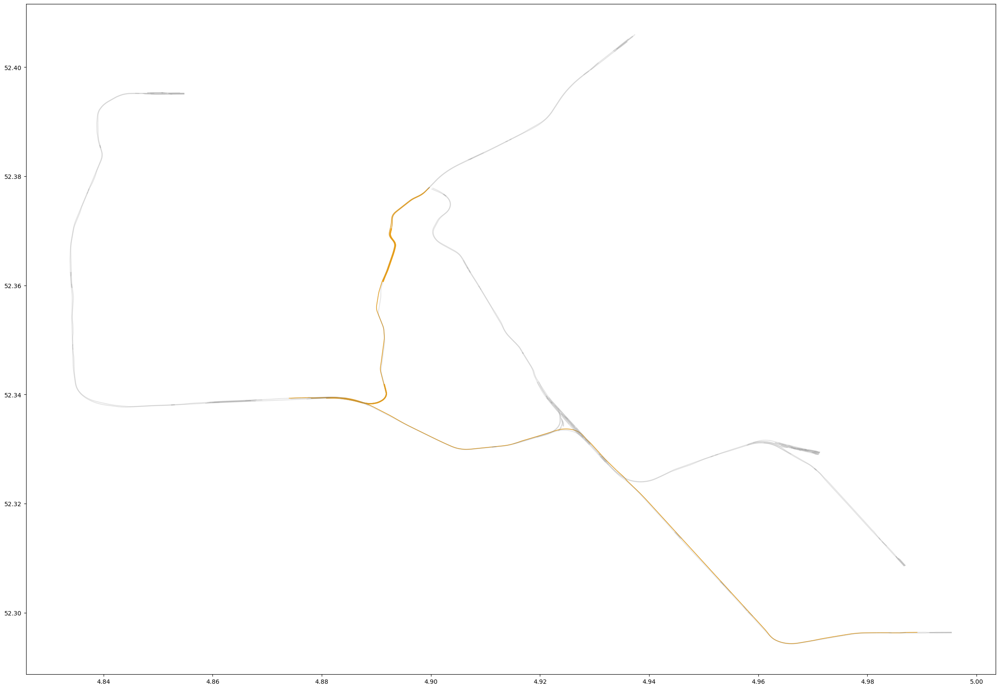

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(city_tram_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)

gpd.GeoDataFrame(shortest_path_edges_way.copy()).plot(ax=ax, zorder=1, linewidth=(shortest_path_edges_way.count_weight), color='orange')

### Get the same route information--- A route gdf

In [43]:
def s_e_same_route_gdf_metro(s_e_same_routes_df,city_tram_routes,start_node):
    s_e_on_possible_route_df = pd.merge(s_e_same_routes_df, city_tram_routes, on='ref', how='left')
    s_e_on_route_possible_gdf = gpd.GeoDataFrame(s_e_on_possible_route_df.copy())
    start_node_gdf = gpd.GeoDataFrame(start_node.copy())
    s_e_on_same_route_gdf = s_e_on_route_possible_gdf[s_e_on_route_possible_gdf.geometry.buffer(0.000001).intersects(start_node_gdf.iloc[0]['geometry'])]
    s_e_on_same_route_gdf = s_e_on_same_route_gdf.reset_index(drop = True)
    return start_node_gdf,s_e_on_same_route_gdf

In [44]:
start_node_gdf,s_e_on_same_route_gdf = s_e_same_route_gdf_metro(s_e_same_routes_df,city_tram_routes,start_node)

TypeError: Can only merge Series or DataFrame objects, a <class 'NoneType'> was passed

In [ ]:
s_e_on_same_route_gdf

### Get all stations between s_e nodes

In [ ]:
def all_btw_stations_on_same_route_gdf_metro(merged_order_route_dict, s_e_on_same_route_gdf, start_node,end_node):
    all_stations_on_same_route = merged_order_route_dict[s_e_on_same_route_gdf.name[0]]
   
    all_stations_on_same_route_gdf = gpd.GeoDataFrame(all_stations_on_same_route.copy())
    
    start_node_gdf = gpd.GeoDataFrame(start_node.copy())
    end_node_gdf = gpd.GeoDataFrame(end_node.copy())

    start_station_index = shapely.distance(start_node_gdf.geometry.values,all_stations_on_same_route_gdf.geometry.values).argmin()
    end_station_index = shapely.distance(end_node_gdf.geometry.values,all_stations_on_same_route_gdf.geometry.values).argmin()
    all_btw_stations_on_same_route_gdf = all_stations_on_same_route_gdf.iloc[start_station_index:end_station_index+1]

    return all_btw_stations_on_same_route_gdf

In [ ]:
all_btw_stations_on_same_route_gdf = all_btw_stations_on_same_route_gdf_metro(city_tram_order_route_dict, s_e_on_same_route_gdf, start_node_gdf)
all_btw_stations_on_same_route_gdf

### Get all nodes and id_pairs of nodes between s_e nodes

In [ ]:
def btw_all_ids_pairs_transfer_all(all_btw_stations_on_same_route_gdf, three_networks_nodes_transfer_all):
    s_e_between_nodes = three_networks_nodes_transfer_all.merge(all_btw_stations_on_same_route_gdf, on = 'coordinate_value', suffixes=('', '_drop'))

    btw_all_id_pairs_list = []
    s_e_btw_nodes_transfer_all = three_networks_nodes_transfer_all.merge(all_btw_stations_on_same_route_gdf, on = 'coordinate_value', suffixes=('', '_drop'))

   

    id_pairs_way1 = pd.DataFrame(columns=['s_id', 'e_id'])

  
    for i in range(len(s_e_btw_nodes_transfer_all)-1):
           
        id_pairs_way1.loc[i, 's_id'] = s_e_btw_nodes_transfer_all.loc[i, 'id']
        id_pairs_way1.loc[i, 'e_id'] = s_e_btw_nodes_transfer_all.loc[i+1, 'id']
        

    btw_all_id_pairs_list.append(id_pairs_way1)

    return btw_all_id_pairs_list

In [ ]:
btw_all_id_pairs_list = btw_all_ids_pairs_transfer_all(all_btw_stations_on_same_route_gdf,city_tram_new_nodes)
btw_all_id_pairs_list

### Calculate shortest path and plot

In [ ]:
btw_all_id_pairs_list_unique = drop_df_in_list(btw_all_id_pairs_list)

In [ ]:
btw_all_id_pairs_list_unique

In [ ]:
G = create_ground_graph(city_tram_new_edges, city_tram_new_nodes)

In [ ]:
shortest_path_pairs_way = all_shortest_paths(G, btw_all_id_pairs_list_unique[0], city_tram_new_edges)

In [ ]:
shortest_path_pairs_way

In [ ]:
duplicate_row_count_way, shortest_path_edges_way, edges_way = edges_with_count_weight(shortest_path_pairs_way, city_tram_new_edges)

In [ ]:
shortest_path_edges_way

In [ ]:
shortest_path_edges_way.time.sum()

<Axes: >

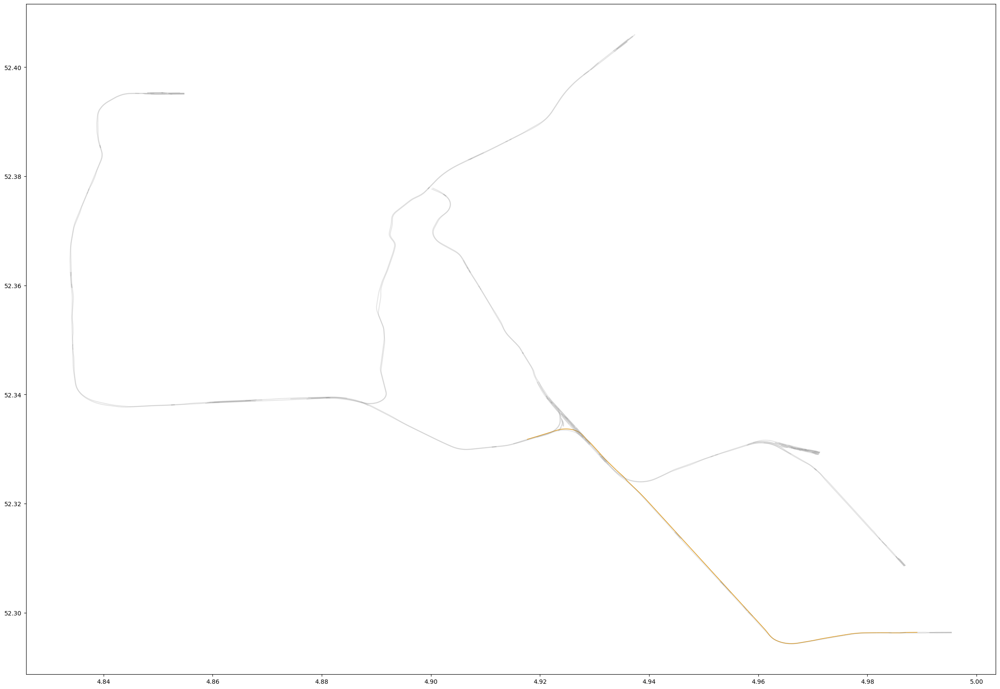

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))

gpd.GeoDataFrame(city_tram_new_edges.copy()).plot(ax=ax, color='gray', alpha=0.2)

gpd.GeoDataFrame(shortest_path_edges_way.copy()).plot(ax=ax, zorder=1, linewidth=(shortest_path_edges_way.count_weight), color='orange')

In [69]:
# convert coordinates in station_df from degree to meter
def convert_deg_to_meter(new_nodes_df):
    # Convert the 'geometry' column to a Point object
    new_nodes_df['geometry'] = new_nodes_df.apply(lambda row: Point(row['geo_x'], row['geo_y']), axis=1)
    
    # Define the coordinate reference systems (CRS)
    crs_deg = 'EPSG:4326'  # WGS 84, the standard coordinate system for GPS
    crs_meter = 'EPSG:3857'  # World Mercator, commonly used for distance calculations

    # Create a transformer to convert from degrees to meters
    transformer = Transformer.from_crs(crs_deg, crs_meter, always_xy=True)

    # Apply the transformer to each Point in the 'geometry' column
    new_nodes_df['geometry'] = new_nodes_df['geometry'].apply(lambda point: Point(transformer.transform(point.x, point.y)))
    
    return new_nodes_df

In [70]:
def new_nodes_buffer(new_nodes_df,buffer_radius):
    new_nodes_df = convert_deg_to_meter(new_nodes_df)
    node_buffers = []

    for index, row in new_nodes_df.iterrows():
        point = row['geometry']
        buffer = point.buffer(buffer_radius)
        node_buffers.append(buffer)

    buffered_gdf = gpd.GeoDataFrame(geometry=node_buffers)
    buffered_df = pd.DataFrame(buffered_gdf).rename(columns={'geometry': 'buffer_geometry'})
    new_nodes_buffer_geometry = pd.concat([new_nodes_df,buffered_df],axis=1)
    return new_nodes_buffer_geometry

In [71]:
def add_footnote_to_new_nodes(new_nodes_df):
    new_nodes_df = convert_deg_to_meter(new_nodes_df)
    # create a exactly same dataframe with new_nodes_df but name columns by different transportation routes
    rename_cols = {
    "geometry": "geometry"+"_"+new_nodes_df.loc[0,'route'],
    "degree": "degree"+"_"+new_nodes_df.loc[0,'route'],
    "id": "id"+"_"+new_nodes_df.loc[0,'route'],
    "name": "name"+"_"+new_nodes_df.loc[0,'route'],
    "geo_x": "geo_x"+"_"+new_nodes_df.loc[0,'route'],
    "geo_y": "geo_y"+"_"+new_nodes_df.loc[0,'route'],
    "coordinate_value": "coordinate_value"+"_"+new_nodes_df.loc[0,'route'],
    "route_name_list": "route_name_list"+"_"+new_nodes_df.loc[0,'route'],
    "route": "route"+"_"+new_nodes_df.loc[0,'route'],
    "ref": "ref"+"_"+new_nodes_df.loc[0,'route'],
    "transfer": "transfer"+"_"+new_nodes_df.loc[0,'route']
    }
    new_nodes_ftn = new_nodes_df.rename(columns=rename_cols)
    return new_nodes_ftn

In [72]:
def transfer_A_to_B(A_new_nodes_buffer_geometry,B_new_nodes_ftn):
    transfer_stations_A_to_B = pd.DataFrame()
    
    for index, row in A_new_nodes_buffer_geometry.iterrows():
        each_transfer_stations_df = B_new_nodes_ftn[row['buffer_geometry'].intersects(B_new_nodes_ftn.iloc[:, 0])]
        
        if not each_transfer_stations_df.empty:
            replicated_row = pd.concat([row] * len(each_transfer_stations_df), axis=1).transpose()
            replicated_row.reset_index(drop=True, inplace=True)  # Reset the index
            each_transfer_stations_df.reset_index(drop=True, inplace=True)  # Reset the index
            co_df = pd.concat([replicated_row,each_transfer_stations_df], axis=1)
            transfer_stations_A_to_B = pd.concat([transfer_stations_A_to_B,co_df])
            
       

    return transfer_stations_A_to_B

In [73]:
def process_ref_transfer_all(cell_value):
    if pd.notna(cell_value):  # 检查是否是 NaN 值
        return set(filter(lambda x: x != 'nan', map(str.strip, cell_value.split(','))))
    else:
        return set()

In [74]:
def add_ref_transfer_all_to_new_nodes(transfer_stations_A_to_B, transfer_stations_A_to_C, A_new_nodes):

    selected_columns_to_B = transfer_stations_A_to_B.iloc[:, [0, 3, 9,21]]

    unique_rows_to_B = selected_columns_to_B.drop_duplicates(subset='geometry')

    unique_rows_to_B['ref_1'] = unique_rows_to_B.apply(lambda row: f"{row.iloc[2]}, {row.iloc[3]}", axis=1)


    transfer_ref_to_B = unique_rows_to_B[['name', 'ref_1']].drop_duplicates(subset='name')

    A_new_nodes_to_B = pd.merge(A_new_nodes,transfer_ref_to_B,on = 'name', how = 'left')

    
    selected_columns_to_C = transfer_stations_A_to_C.iloc[:, [0, 3, 9,21]]

    unique_rows_to_C = selected_columns_to_C.drop_duplicates(subset='geometry')

    unique_rows_to_C['ref_2'] = unique_rows_to_C.apply(lambda row: f"{row.iloc[2]}, {row.iloc[3]}", axis=1)


    transfer_ref_to_C = unique_rows_to_C[['name', 'ref_2']].drop_duplicates(subset='name')

    A_new_nodes_to_B_C = pd.merge(A_new_nodes_to_B,transfer_ref_to_C,on = 'name', how = 'left')
    

    A_new_nodes_to_B_C['ref_transfer_all'] = A_new_nodes_to_B_C.apply(lambda row: f"{row['ref']}, {row['ref_1']}, {row['ref_2']}", axis=1)
    
    A_new_nodes_to_B_C['ref_transfer_all'] = A_new_nodes_to_B_C['ref_transfer_all'].apply(process_ref_transfer_all)

    A_new_nodes_transfer_all = A_new_nodes_to_B_C
    

    return A_new_nodes_transfer_all

In [75]:
buffer_radius = 200

In [76]:
city_sub_new_nodes_buffer_geometry = new_nodes_buffer(city_sub_new_nodes,buffer_radius)

city_tram_new_nodes_ftn = add_footnote_to_new_nodes(city_tram_new_nodes)
transfer_stations_sub_to_tram = transfer_A_to_B(city_sub_new_nodes_buffer_geometry,city_tram_new_nodes_ftn)

city_bus_new_nodes_ftn = add_footnote_to_new_nodes(city_bus_new_nodes)
transfer_stations_sub_to_bus = transfer_A_to_B(city_sub_new_nodes_buffer_geometry,city_bus_new_nodes_ftn)

city_sub_new_nodes_transfer_all = add_ref_transfer_all_to_new_nodes(transfer_stations_sub_to_tram, transfer_stations_sub_to_bus, city_sub_new_nodes)
city_sub_new_nodes_transfer_all

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,ref_1,ref_2,ref_transfer_all
0,POINT (555390.884 6853898.052),2,328,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 47","{47, 50, 54}"
1,POINT (553703.169 6853757.861),2,855,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 47","{47, 50, 54}"
2,POINT (552158.745 6854212.080),2,854,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,NaN,"{50, 54}"
3,POINT (551268.501 6855802.630),2,810,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,NaN,"{50, 54}"
4,POINT (550766.294 6856701.528),2,809,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 44, 47, 49, 66","{54, 44, 50, 47, 66, 49}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,POINT (552961.225 6859717.546),2,824,Verrijn Stuartweg,4.967335,52.328367,"(4.9673352, 52.3283668)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,NaN,NaN,{53}
82,POINT (551775.962 6860088.944),2,823,Station Diemen Zuid,4.956688,52.330406,"(4.9566878, 52.3304057)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,NaN,"53, 44","{44, 53}"
83,POINT (550617.070 6859438.093),2,829,Venserpolder,4.946277,52.326833,"(4.9462773, 52.3268326)",Metro 53: Gaasperplas => Centraal Station,subway,53,None,NaN,NaN,{53}
84,POINT (548836.771 6859966.806),2,827,Van der Madeweg,4.930285,52.329735,"(4.9302846, 52.3297352)",Metro 53: Gaasperplas => Centraal Station,subway,"50, 53, 54","50, 53, 54",NaN,NaN,"{54, 50, 53}"


In [77]:
city_tram_new_nodes_buffer_geometry = new_nodes_buffer(city_tram_new_nodes,buffer_radius)

city_sub_new_nodes_ftn = add_footnote_to_new_nodes(city_sub_new_nodes)
transfer_stations_tram_to_sub = transfer_A_to_B(city_tram_new_nodes_buffer_geometry,city_sub_new_nodes_ftn)

city_bus_new_nodes_ftn = add_footnote_to_new_nodes(city_bus_new_nodes)
transfer_stations_tram_to_bus = transfer_A_to_B(city_tram_new_nodes_buffer_geometry,city_bus_new_nodes_ftn)

city_tram_new_nodes_transfer_all = add_ref_transfer_all_to_new_nodes(transfer_stations_tram_to_sub, transfer_stations_tram_to_bus, city_tram_new_nodes)
city_tram_new_nodes_transfer_all

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,ref_1,ref_2,ref_transfer_all
0,POINT (549095.945 6865626.846),2,1341,Muiderpoortstation,4.932613,52.360796,"(4.9326128, 52.3607965)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3",NaN,"1, 3, 22, 240, 245, 37, 40, 41","{245, 1, 240, 37, 40, 41, 22, 3}"
1,POINT (548687.336 6865651.437),2,1503,Dapperstraat,4.928942,52.360931,"(4.9289422, 52.3609314)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3",NaN,"1, 3, 245, 37, 41","{245, 1, 37, 41, 3}"
2,POINT (548326.739 6865502.838),2,1606,Linnaeusstraat,4.925703,52.360116,"(4.9257029, 52.3601162)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3",NaN,"1, 3, 245, 37, 41","{245, 1, 37, 41, 3}"
3,POINT (547329.238 6865312.719),2,1612,Beukenweg,4.916742,52.359073,"(4.9167422, 52.3590732)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 3","1, 3",NaN,NaN,"{3, 1}"
4,POINT (546978.593 6865909.649),2,1598,Korte 's-Gravesandestraat,4.913592,52.362348,"(4.9135923, 52.3623479)",Tram 1: Amsterdam Muiderpoortstation =>Amsterd...,tram,"1, 19, 7","1, 19, 7",NaN,NaN,"{19, 7, 1}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
413,POINT (548393.230 6866966.046),2,1559,Eerste Coehoornstraat,4.926300,52.368143,"(4.9263002, 52.3681426)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None,NaN,"7, 22","{7, 22}"
414,POINT (548760.528 6867340.750),2,1808,Eerste Leeghwaterstraat,4.929600,52.370198,"(4.9295997, 52.3701978)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None,NaN,NaN,{7}
415,POINT (549343.063 6867853.627),2,1515,Rietlandpark,4.934833,52.373011,"(4.9348327, 52.3730107)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,"26, 7","26, 7",NaN,NaN,"{7, 26}"
416,POINT (549714.592 6867935.478),2,1751,C. van Eesterenlaan,4.938170,52.373460,"(4.9381702, 52.3734596)",Tram 7: Amsterdam Slotermeer => Amsterdam Azar...,tram,7,None,NaN,"7, 246, 43, 65","{246, 43, 7, 65}"


In [78]:
city_bus_new_nodes_buffer_geometry = new_nodes_buffer(city_bus_new_nodes,buffer_radius)

sub_new_nodes_ftn = add_footnote_to_new_nodes(city_sub_new_nodes)
transfer_stations_bus_to_sub = transfer_A_to_B(city_bus_new_nodes_buffer_geometry,city_sub_new_nodes_ftn)

city_tram_new_nodes_ftn = add_footnote_to_new_nodes(city_tram_new_nodes)
transfer_stations_bus_to_tram = transfer_A_to_B(city_bus_new_nodes_buffer_geometry,city_tram_new_nodes_ftn)

city_bus_new_nodes_transfer_all = add_ref_transfer_all_to_new_nodes(transfer_stations_bus_to_sub, transfer_stations_bus_to_tram, city_bus_new_nodes)
city_bus_new_nodes_transfer_all

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,ref_1,ref_2,ref_transfer_all
0,POINT (542352.511 6861986.021),2,14779,Station Zuid,4.872035,52.340819,"(4.8720355, 52.3408188)",Bus 15: Amsterdam Station Zuid => Amsterdam St...,bus,"15, 62, 65","15, 62, 65",NaN,"15, 62, 65, 25, 5","{62, 5, 25, 15, 65}"
1,POINT (541935.542 6862364.157),2,67476,Prinses Irenestraat,4.868290,52.342894,"(4.8682898, 52.3428941)",Bus 15: Amsterdam Station Zuid => Amsterdam St...,bus,"15, 246, 65","15, 246, 65",NaN,"15, 246, 65, 5","{246, 5, 15, 65}"
2,POINT (541665.280 6862982.298),2,68204,Olympiaplein,4.865862,52.346286,"(4.865862, 52.3462864)",Bus 15: Amsterdam Station Zuid => Amsterdam St...,bus,15,None,NaN,"15, 24","{24, 15}"
3,POINT (540828.703 6862792.858),2,68196,Olympiaweg,4.858347,52.345247,"(4.8583469, 52.3452468)",Bus 15: Amsterdam Station Zuid => Amsterdam St...,bus,15,None,NaN,"15, 24","{24, 15}"
4,POINT (540749.065 6863516.510),2,68341,Haarlemmermeerstation,4.857632,52.349218,"(4.8576315, 52.3492179)",Bus 15: Amsterdam Station Zuid => Amsterdam St...,bus,"15, 62","15, 62",NaN,NaN,"{62, 15}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
752,POINT (556012.069 6864681.113),2,67471,Diemerparklaan,4.994741,52.355608,"(4.9947414, 52.355608)",Bus 66: Amsterdam Bijlmer ArenA => Amsterdam I...,bus,66,None,NaN,"66, 26","{66, 26}"
753,POINT (537054.649 6861912.084),3,15699,John M. Keynesplein,4.824444,52.340413,"(4.824444, 52.340413)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,"267, 68","267, 68",NaN,NaN,"{267, 68}"
754,POINT (537438.034 6862033.668),2,11244,IBM,4.827888,52.341080,"(4.827888, 52.3410803)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,"267, 68","267, 68",NaN,NaN,"{267, 68}"
755,POINT (537524.885 6862309.730),3,26843,Parkeerdek,4.828668,52.342595,"(4.8286682, 52.3425954)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,68,None,NaN,NaN,{68}


In [79]:
three_networks_nodes_transfer_all = pd.concat([city_sub_new_nodes_transfer_all,city_tram_new_nodes_transfer_all,city_bus_new_nodes_transfer_all]).reset_index(drop=True)

In [80]:
three_networks_nodes_transfer_all

,geometry,degree,id,name,geo_x,geo_y,coordinate_value,route_name_list,route,ref,transfer,ref_1,ref_2,ref_transfer_all
0,POINT (555390.884 6853898.052),2,328,Gein,4.989161,52.296407,"(4.9891612, 52.2964067)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 47","{47, 50, 54}"
1,POINT (553703.169 6853757.861),2,855,Reigersbos,4.974000,52.295637,"(4.9740002, 52.2956365)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 47","{47, 50, 54}"
2,POINT (552158.745 6854212.080),2,854,Holendrecht,4.960126,52.298132,"(4.9601264, 52.2981319)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,NaN,"{50, 54}"
3,POINT (551268.501 6855802.630),2,810,Bullewijk,4.952129,52.306869,"(4.9521292, 52.306869)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,NaN,"{50, 54}"
4,POINT (550766.294 6856701.528),2,809,Bijlmer ArenA,4.947618,52.311806,"(4.9476178, 52.311806)",Metro 50: Gein => Isolatorweg,subway,"50, 54","50, 54",NaN,"50, 54, 44, 47, 49, 66","{54, 44, 50, 47, 66, 49}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1256,POINT (556012.069 6864681.113),2,67471,Diemerparklaan,4.994741,52.355608,"(4.9947414, 52.355608)",Bus 66: Amsterdam Bijlmer ArenA => Amsterdam I...,bus,66,None,NaN,"66, 26","{66, 26}"
1257,POINT (537054.649 6861912.084),3,15699,John M. Keynesplein,4.824444,52.340413,"(4.824444, 52.340413)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,"267, 68","267, 68",NaN,NaN,"{267, 68}"
1258,POINT (537438.034 6862033.668),2,11244,IBM,4.827888,52.341080,"(4.827888, 52.3410803)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,"267, 68","267, 68",NaN,NaN,"{267, 68}"
1259,POINT (537524.885 6862309.730),3,26843,Parkeerdek,4.828668,52.342595,"(4.8286682, 52.3425954)",Bus 68: Amsterdam Riekerpolder => Amsterdam He...,bus,68,None,NaN,NaN,{68}
